In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv("D:/Man/ERP/code/data/XGBoost_AllResults.csv")
df.head()

,max_depth,min_child_weight,R2,RMSE,MAE,BIAS
0,4,3,0.414413,6.780260,4.545279,0.593282
1,4,5,0.415088,6.776351,4.541746,0.590527
2,4,7,0.411279,6.798381,4.544228,0.543049
3,4,9,0.414209,6.781445,4.534928,0.540705
4,4,15,0.412239,6.792839,4.535422,0.513333


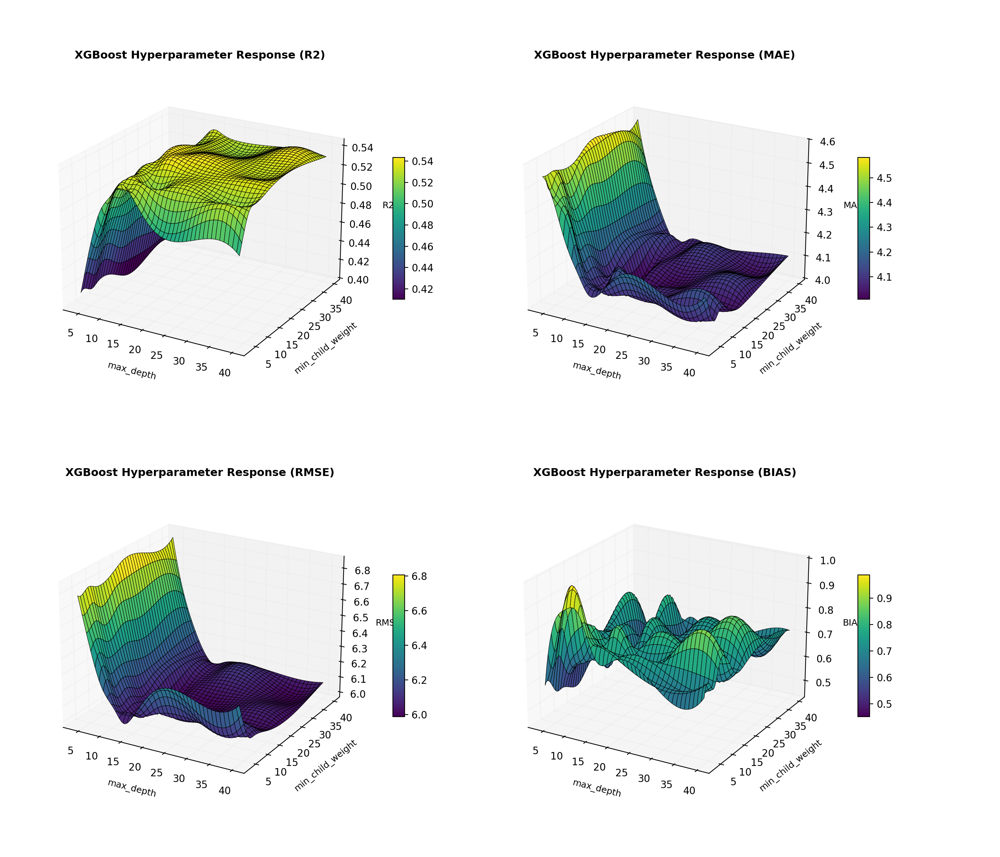

In [1]:
from scipy.interpolate import RectBivariateSpline

numeric_cols = ['max_depth','min_child_weight','R2','RMSE','MAE','BIAS']

df[numeric_cols] = df[numeric_cols].apply(
    pd.to_numeric,
    errors='coerce'
)

def _metric_surface(df, xcol, ycol, metric, n=120):
    pivot = (
        df.pivot_table(index=ycol, columns=xcol, values=metric, aggfunc='mean')
        .sort_index(axis=0)
        .sort_index(axis=1)
    )
    xs = pivot.columns.to_numpy(dtype=float)
    ys = pivot.index.to_numpy(dtype=float)
    spline = RectBivariateSpline(ys, xs, pivot.to_numpy(dtype=float), kx=3, ky=3)
    x_range = np.linspace(xs.min(), xs.max(), n)
    y_range = np.linspace(ys.min(), ys.max(), n)
    gx, gy = np.meshgrid(x_range, y_range)
    gz = spline(y_range, x_range)
    return gx, gy, gz

grid_x, grid_y, grid_r2 = _metric_surface(df, 'max_depth', 'min_child_weight', 'R2')
_, _, grid_mae = _metric_surface(df, 'max_depth', 'min_child_weight', 'MAE')
_, _, grid_rmse = _metric_surface(df, 'max_depth', 'min_child_weight', 'RMSE')
_, _, grid_bias = _metric_surface(df, 'max_depth', 'min_child_weight', 'BIAS')

# Response surfaces for R2, MAE, RMSE and BIAS
fig3d = plt.figure(figsize=(14, 12), dpi=200)
metrics_grids = [grid_r2, grid_mae, grid_rmse, grid_bias]
metrics_names = ['R2', 'MAE', 'RMSE', 'BIAS']

for i, (grid_z, name) in enumerate(zip(metrics_grids, metrics_names)):
    ax = fig3d.add_subplot(2, 2, i+1, projection='3d')

    surf = ax.plot_surface(
        grid_x, grid_y, grid_z,
        cmap='viridis',
        linewidth=0.4,
        antialiased=True,
        edgecolors='black',
        rcount=40, ccount=40
    )

    ax.view_init(elev=22, azim=-60)
    ax.set_title(f'XGBoost Hyperparameter Response ({name})', fontsize=11, fontweight='bold', pad=10)
    ax.set_xlabel('max_depth', fontsize=9, labelpad=8)
    ax.set_ylabel('min_child_weight', fontsize=9, labelpad=8)
    ax.set_zlabel(name, fontsize=9, labelpad=8)

    for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
        axis._axinfo["grid"]['color'] = (0.9, 0.9, 0.9, 0.4)

    fig3d.colorbar(surf, ax=ax, shrink=0.4, aspect=12, pad=0.08)

fig3d.subplots_adjust(left=0.04, right=0.92, top=0.94, bottom=0.04, wspace=0.12, hspace=0.18)
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/XGBoost_3D.png"), Path(r"D:/Man/ERP/Figure/XGBoost_3D.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        fig3d.savefig(out, dpi=300)
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


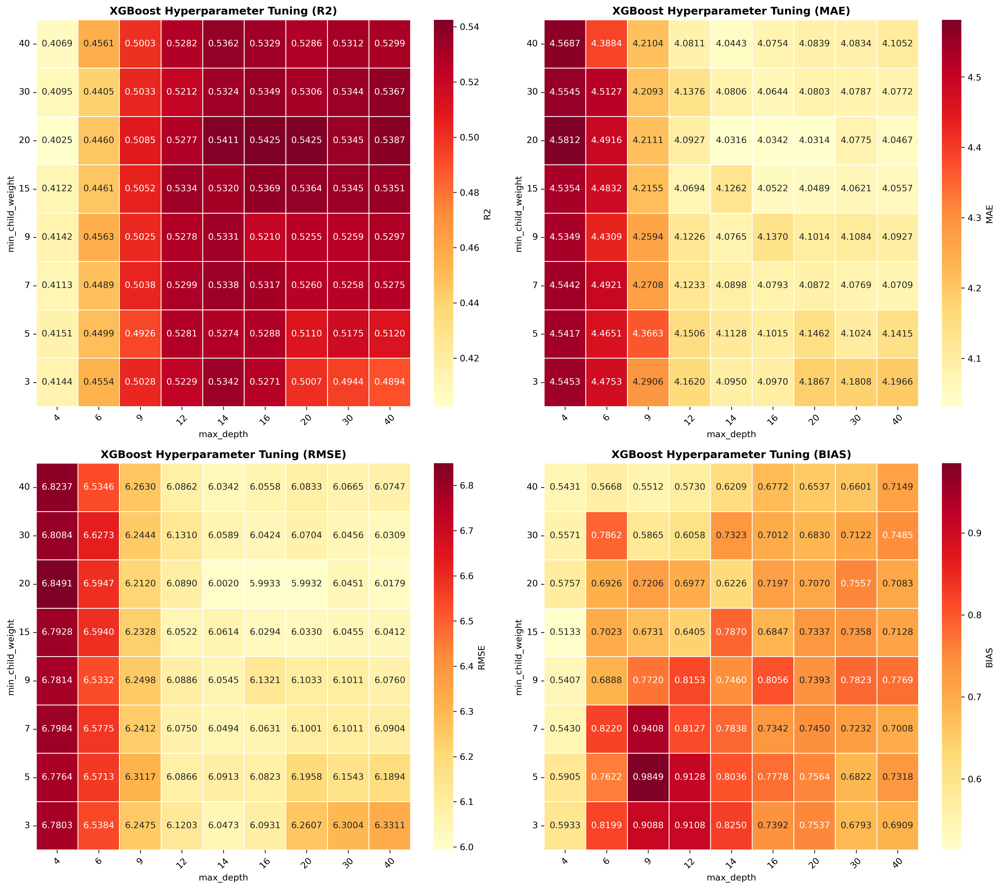

In [1]:

metrics = ["R2", "MAE", "RMSE", "BIAS"]

fig, axes = plt.subplots(2, 2, figsize=(16, 14), dpi=200)

for ax, metric in zip(axes.flat, metrics):
    heatmap_data = df.pivot(
        index="min_child_weight",
        columns="max_depth",
        values=metric
    ).sort_index(ascending=False)

    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".4f",
        cmap="YlOrRd",
        linewidths=0.5,
        linecolor="white",
        cbar_kws={"label": metric},
        ax=ax
    )

    ax.set_title(f"XGBoost Hyperparameter Tuning ({metric})", fontsize=12, fontweight="bold")
    ax.set_xlabel("max_depth")
    ax.set_ylabel("min_child_weight")
    ax.tick_params(axis="x", rotation=45)
    ax.tick_params(axis="y", rotation=0)

plt.tight_layout()
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/XGBoost_heatmap.png"), Path(r"D:/Man/ERP/Figure/XGBoost_heatmap.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(out, dpi=300, bbox_inches="tight")
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


In [6]:
# SVM
svm_df = pd.read_csv("D:/Man/ERP/code/data/SVM_AllResults.csv")
svm_df.head()

,C,Epsilon,R2,RMSE,MAE,BIAS
0,0.1,0.01000,-1.667727,14.471764,13.358976,12.045946
1,0.1,0.05000,-1.664051,14.461790,13.349469,12.035998
2,0.1,0.00100,-1.669698,14.477111,13.364306,12.050575
3,0.1,0.00010,-1.669698,14.477111,13.364306,12.050575
4,0.1,0.00001,-1.669698,14.477111,13.364306,12.050575


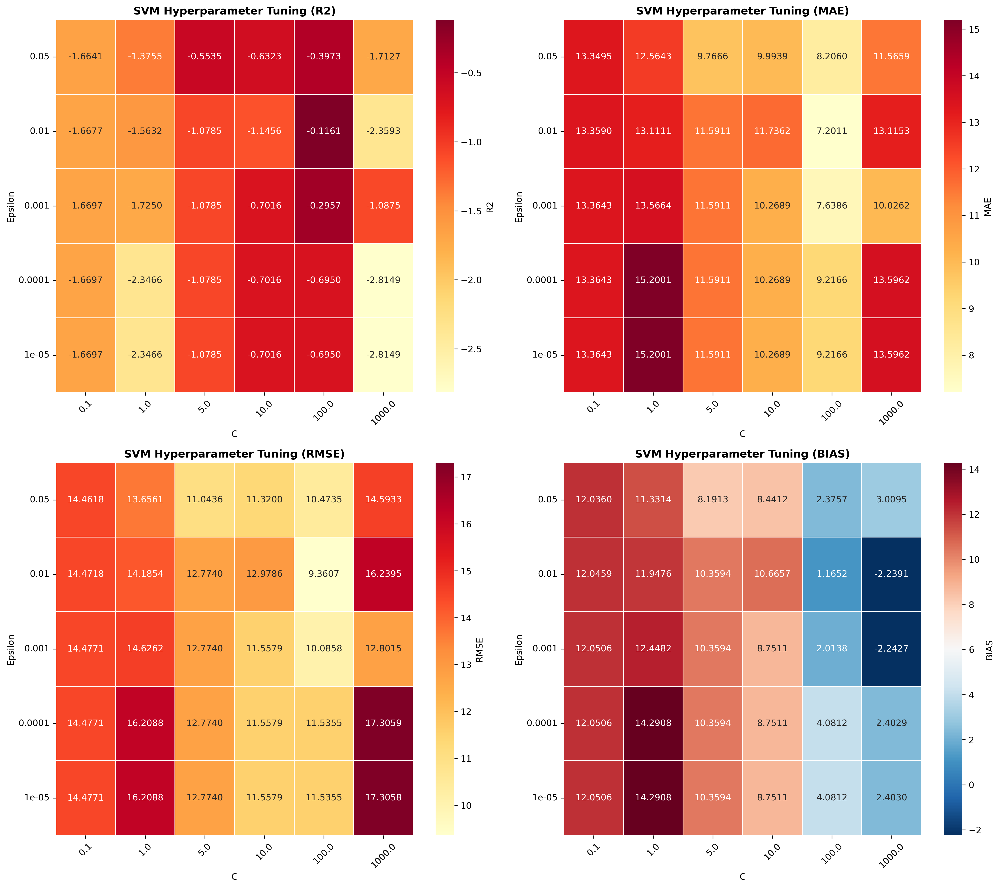

In [1]:

cmaps = ["YlOrRd", "YlOrRd", "YlOrRd", "RdBu_r"]

fig, axes = plt.subplots(2, 2, figsize=(16, 14), dpi=200)

for ax, metric, cmap in zip(axes.flat, metrics, cmaps):
    heatmap_data = svm_df.pivot(
        index="Epsilon",
        columns="C",
        values=metric
    ).sort_index(ascending=False)

    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".4f",
        cmap=cmap,
        linewidths=0.5,
        linecolor="white",
        cbar_kws={"label": metric},
        ax=ax
    )

    ax.set_title(f"SVM Hyperparameter Tuning ({metric})", fontsize=12, fontweight="bold")
    ax.set_xlabel("C")
    ax.set_ylabel("Epsilon")
    ax.tick_params(axis="x", rotation=45)
    ax.tick_params(axis="y", rotation=0)

plt.tight_layout()
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/SVM_heatmap.png"), Path(r"D:/Man/ERP/Figure/SVM_heatmap.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(out, dpi=300, bbox_inches="tight")
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


In [8]:
# LightGBM
lgbm_df = pd.read_csv("D:/Man/ERP/code/data/LightGBM_AllResults.csv")
lgbm_df.head()

,num_leaves,min_data_in_leaf,R2,RMSE,MAE,BIAS
0,20,5,0.381010,6.970958,4.300984,-0.609793
1,20,10,0.381010,6.970958,4.300984,-0.609793
2,20,20,0.382719,6.961331,4.293424,-0.616380
3,20,50,0.388709,6.927471,4.277064,-0.570969
4,20,100,0.383821,6.955116,4.286525,-0.633599


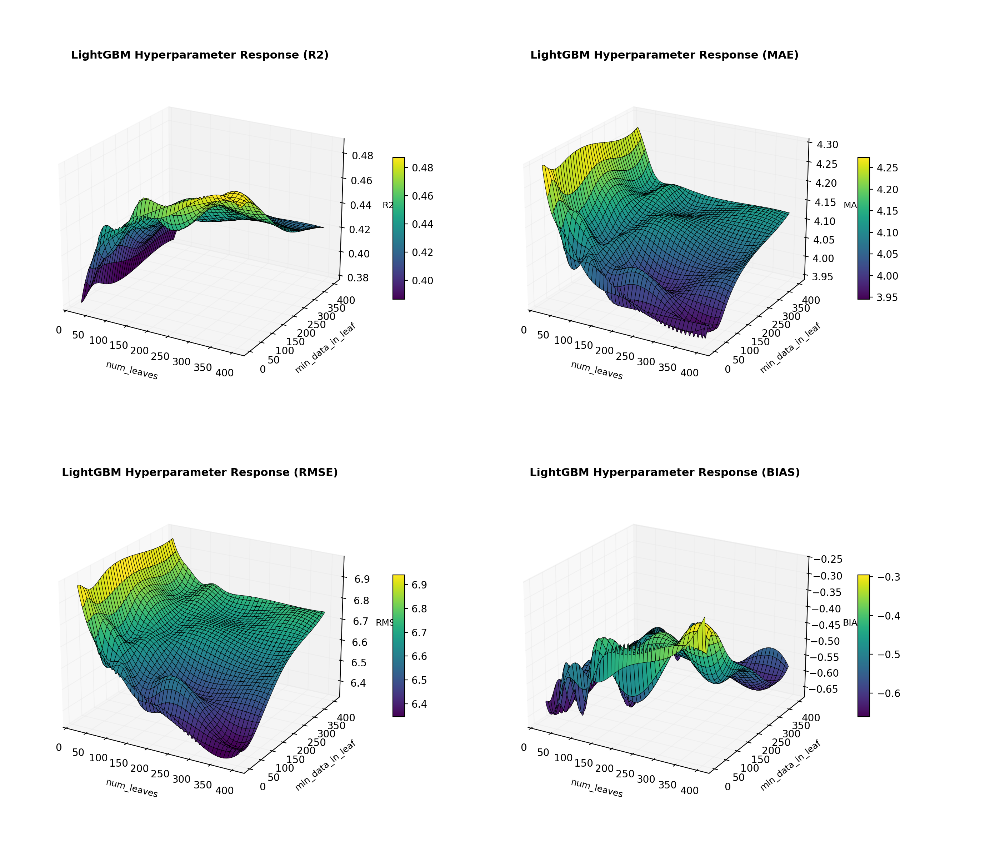

In [1]:
from scipy.interpolate import RectBivariateSpline

numeric_cols = ['num_leaves','min_data_in_leaf','R2','RMSE','MAE','BIAS']

lgbm_df[numeric_cols] = lgbm_df[numeric_cols].apply(
    pd.to_numeric,
    errors='coerce'
)

def _metric_surface(df, xcol, ycol, metric, n=120):
    pivot = (
        df.pivot_table(index=ycol, columns=xcol, values=metric, aggfunc='mean')
        .sort_index(axis=0)
        .sort_index(axis=1)
    )
    xs = pivot.columns.to_numpy(dtype=float)
    ys = pivot.index.to_numpy(dtype=float)
    spline = RectBivariateSpline(ys, xs, pivot.to_numpy(dtype=float), kx=3, ky=3)
    x_range = np.linspace(xs.min(), xs.max(), n)
    y_range = np.linspace(ys.min(), ys.max(), n)
    gx, gy = np.meshgrid(x_range, y_range)
    gz = spline(y_range, x_range)
    return gx, gy, gz

grid_x, grid_y, grid_r2 = _metric_surface(lgbm_df, 'num_leaves', 'min_data_in_leaf', 'R2')
_, _, grid_mae = _metric_surface(lgbm_df, 'num_leaves', 'min_data_in_leaf', 'MAE')
_, _, grid_rmse = _metric_surface(lgbm_df, 'num_leaves', 'min_data_in_leaf', 'RMSE')
_, _, grid_bias = _metric_surface(lgbm_df, 'num_leaves', 'min_data_in_leaf', 'BIAS')

# Response surfaces for R2, MAE, RMSE and BIAS
fig3d = plt.figure(figsize=(14, 12), dpi=200)
metrics_grids = [grid_r2, grid_mae, grid_rmse, grid_bias]
metrics_names = ['R2', 'MAE', 'RMSE', 'BIAS']

for i, (grid_z, name) in enumerate(zip(metrics_grids, metrics_names)):
    ax = fig3d.add_subplot(2, 2, i+1, projection='3d')

    surf = ax.plot_surface(
        grid_x, grid_y, grid_z,
        cmap='viridis',
        linewidth=0.4,
        antialiased=True,
        edgecolors='black',
        rcount=40, ccount=40
    )

    ax.view_init(elev=22, azim=-60)
    ax.set_title(f'LightGBM Hyperparameter Response ({name})', fontsize=11, fontweight='bold', pad=10)
    ax.set_xlabel('num_leaves', fontsize=9, labelpad=8)
    ax.set_ylabel('min_data_in_leaf', fontsize=9, labelpad=8)
    ax.set_zlabel(name, fontsize=9, labelpad=8)

    for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
        axis._axinfo["grid"]['color'] = (0.9, 0.9, 0.9, 0.4)

    fig3d.colorbar(surf, ax=ax, shrink=0.4, aspect=12, pad=0.08)

fig3d.subplots_adjust(left=0.04, right=0.92, top=0.94, bottom=0.04, wspace=0.12, hspace=0.18)
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/LightGBM_3D.png"), Path(r"D:/Man/ERP/Figure/LightGBM_3D.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        fig3d.savefig(out, dpi=300)
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


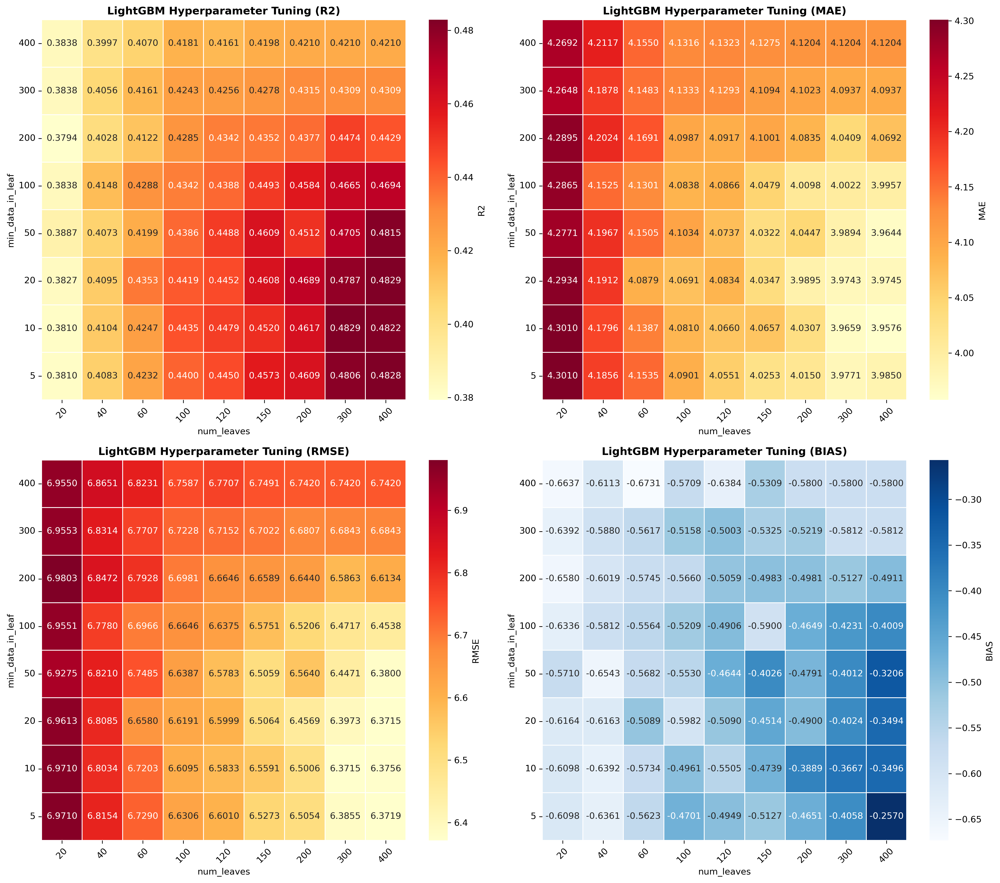

In [1]:

metrics = ["R2", "MAE", "RMSE", "BIAS"]
cmaps_ne = ["YlOrRd", "YlOrRd", "YlOrRd", "Blues"]

fig, axes = plt.subplots(2, 2, figsize=(16, 14), dpi=200)

for ax, metric, cmap in zip(axes.flat, metrics, cmaps_ne):
    heatmap_data = lgbm_df.pivot(
        index="min_data_in_leaf",
        columns="num_leaves",
        values=metric
    ).sort_index(ascending=False)

    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".4f",
        cmap=cmap,
        linewidths=0.5,
        linecolor="white",
        cbar_kws={"label": metric},
        ax=ax
    )

    ax.set_title(f"LightGBM Hyperparameter Tuning ({metric})", fontsize=12, fontweight="bold")
    ax.set_xlabel("num_leaves")
    ax.set_ylabel("min_data_in_leaf")
    ax.tick_params(axis="x", rotation=45)
    ax.tick_params(axis="y", rotation=0)

plt.tight_layout()
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/LightGBM_heatmap.png"), Path(r"D:/Man/ERP/Figure/LightGBM_heatmap.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(out, dpi=300, bbox_inches="tight")
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


In [12]:
# Random forest
rf_df = pd.read_csv("D:/Man/ERP/code/data/RandomForest_AllResults.csv")
rf_df.head()

,max_depth,min_samples_leaf,R2,RMSE,MAE,BIAS
0,5,1,0.217297,7.838796,5.108922,0.040420
1,5,2,0.217428,7.838137,5.108568,0.040492
2,5,5,0.217680,7.836876,5.107210,0.038863
3,5,10,0.218986,7.830335,5.099970,0.030675
4,5,20,0.219507,7.827723,5.097338,0.026813


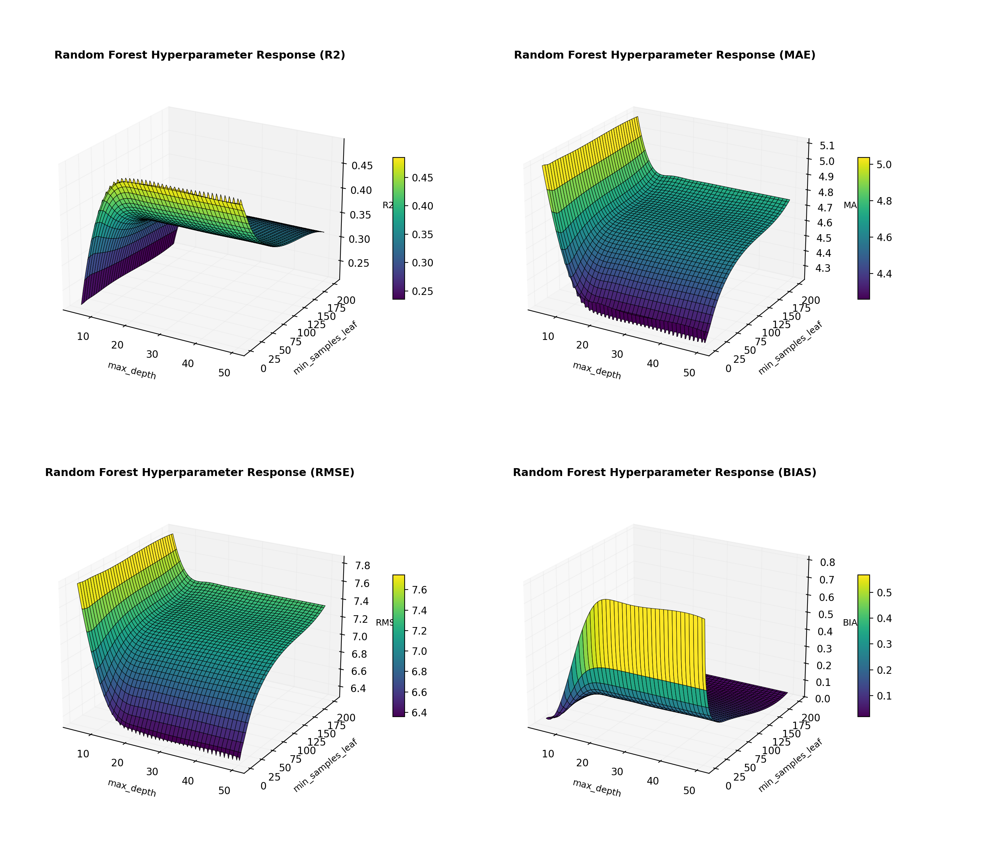

In [1]:
from scipy.interpolate import RectBivariateSpline

numeric_cols = ['max_depth','min_samples_leaf','R2','RMSE','MAE','BIAS']

rf_df[numeric_cols] = rf_df[numeric_cols].apply(
    pd.to_numeric,
    errors='coerce'
)

def _metric_surface(df, xcol, ycol, metric, n=120):
    pivot = (
        df.pivot_table(index=ycol, columns=xcol, values=metric, aggfunc='mean')
        .sort_index(axis=0)
        .sort_index(axis=1)
    )
    xs = pivot.columns.to_numpy(dtype=float)
    ys = pivot.index.to_numpy(dtype=float)
    spline = RectBivariateSpline(ys, xs, pivot.to_numpy(dtype=float), kx=3, ky=3)
    x_range = np.linspace(xs.min(), xs.max(), n)
    y_range = np.linspace(ys.min(), ys.max(), n)
    gx, gy = np.meshgrid(x_range, y_range)
    gz = spline(y_range, x_range)
    return gx, gy, gz

grid_x, grid_y, grid_r2 = _metric_surface(rf_df, 'max_depth', 'min_samples_leaf', 'R2')
_, _, grid_mae = _metric_surface(rf_df, 'max_depth', 'min_samples_leaf', 'MAE')
_, _, grid_rmse = _metric_surface(rf_df, 'max_depth', 'min_samples_leaf', 'RMSE')
_, _, grid_bias = _metric_surface(rf_df, 'max_depth', 'min_samples_leaf', 'BIAS')

# Response surfaces for R2, MAE, RMSE and BIAS
fig3d = plt.figure(figsize=(14, 12), dpi=200)
metrics_grids = [grid_r2, grid_mae, grid_rmse, grid_bias]
metrics_names = ['R2', 'MAE', 'RMSE', 'BIAS']

for i, (grid_z, name) in enumerate(zip(metrics_grids, metrics_names)):
    ax = fig3d.add_subplot(2, 2, i+1, projection='3d')

    surf = ax.plot_surface(
        grid_x, grid_y, grid_z,
        cmap='viridis',
        linewidth=0.4,
        antialiased=True,
        edgecolors='black',
        rcount=40, ccount=40
    )

    ax.view_init(elev=22, azim=-60)
    ax.set_title(f'Random Forest Hyperparameter Response ({name})', fontsize=11, fontweight='bold', pad=10)
    ax.set_xlabel('max_depth', fontsize=9, labelpad=8)
    ax.set_ylabel('min_samples_leaf', fontsize=9, labelpad=8)
    ax.set_zlabel(name, fontsize=9, labelpad=8)

    for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
        axis._axinfo["grid"]['color'] = (0.9, 0.9, 0.9, 0.4)

    fig3d.colorbar(surf, ax=ax, shrink=0.4, aspect=12, pad=0.08)

fig3d.subplots_adjust(left=0.04, right=0.92, top=0.94, bottom=0.04, wspace=0.12, hspace=0.18)
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/RF_3D.png"), Path(r"D:/Man/ERP/Figure/RF_3D.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        fig3d.savefig(out, dpi=300)
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


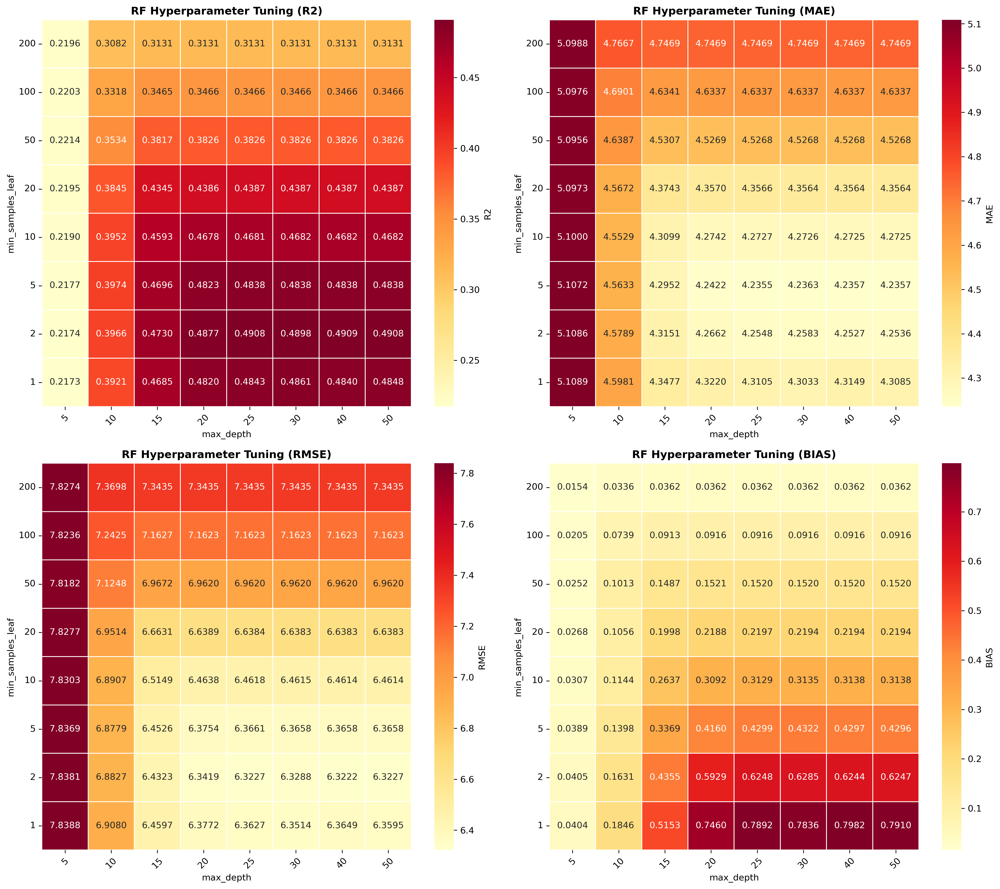

In [1]:

metrics = ["R2", "MAE", "RMSE", "BIAS"]

fig, axes = plt.subplots(2, 2, figsize=(16, 14), dpi=200)

for ax, metric in zip(axes.flat, metrics):
    heatmap_data = rf_df.pivot(
        index="min_samples_leaf",
        columns="max_depth",
        values=metric
    ).sort_index(ascending=False)

    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".4f",
        cmap="YlOrRd",
        linewidths=0.5,
        linecolor="white",
        cbar_kws={"label": metric},
        ax=ax
    )

    ax.set_title(f"RF Hyperparameter Tuning ({metric})", fontsize=12, fontweight="bold")
    ax.set_xlabel("max_depth")
    ax.set_ylabel("min_samples_leaf")
    ax.tick_params(axis="x", rotation=45)
    ax.tick_params(axis="y", rotation=0)

plt.tight_layout()
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/RF_heatmap.png"), Path(r"D:/Man/ERP/Figure/RF_heatmap.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(out, dpi=300, bbox_inches="tight")
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


In [3]:
# MLP
mlp_df = pd.read_csv("D:/Man\ERP/code/data/result_data/MLP_tuning/MLP_AllResults.csv")
mlp_df.head()

,units,n_layers,R2,MAE,RMSE,BIAS
0,96,2,0.3763,3.9723,6.5491,-0.9807
1,96,3,0.4063,3.9109,6.3895,-1.2003
2,96,4,0.4291,3.8660,6.2656,-1.0486
3,96,5,0.4240,3.8909,6.2935,-1.1319
4,96,6,0.2966,4.1276,6.9546,-1.7814


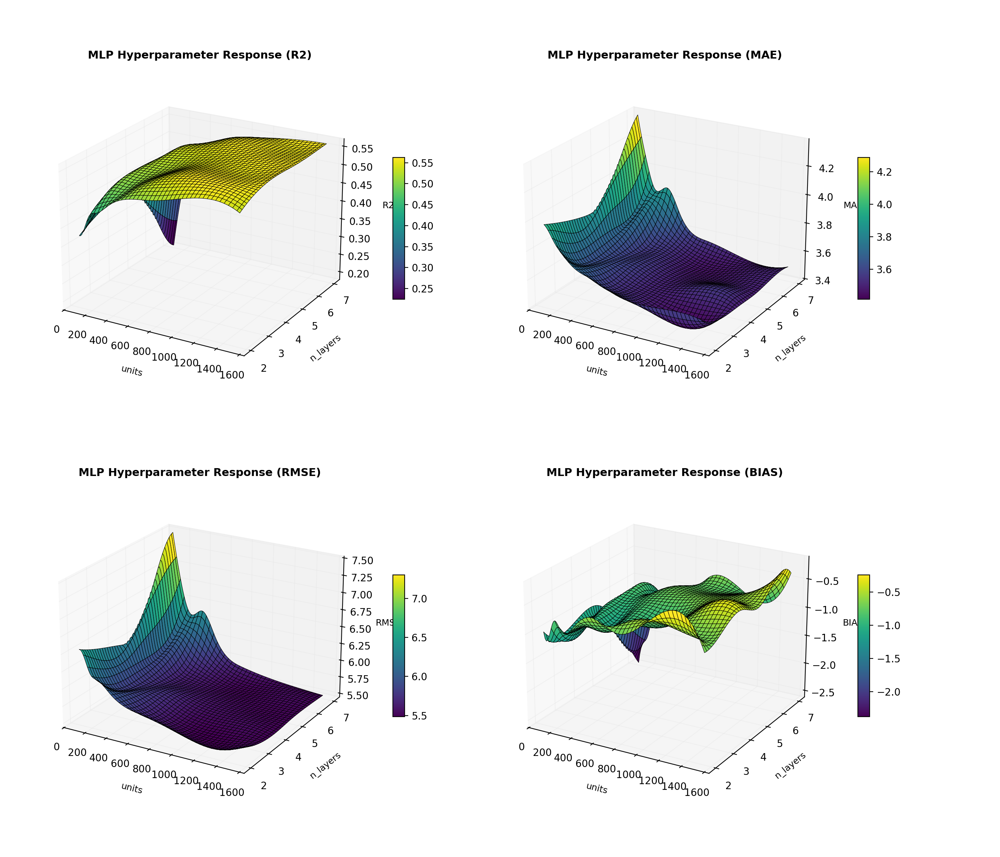

In [1]:
from scipy.interpolate import RectBivariateSpline

numeric_cols = ['units','n_layers','R2','RMSE','MAE','BIAS']

mlp_df[numeric_cols] = mlp_df[numeric_cols].apply(
    pd.to_numeric,
    errors='coerce'
)

def _metric_surface(df, xcol, ycol, metric, n=120):
    pivot = (
        df.pivot_table(index=ycol, columns=xcol, values=metric, aggfunc='mean')
        .sort_index(axis=0)
        .sort_index(axis=1)
    )
    xs = pivot.columns.to_numpy(dtype=float)
    ys = pivot.index.to_numpy(dtype=float)
    spline = RectBivariateSpline(ys, xs, pivot.to_numpy(dtype=float), kx=3, ky=3)
    x_range = np.linspace(xs.min(), xs.max(), n)
    y_range = np.linspace(ys.min(), ys.max(), n)
    gx, gy = np.meshgrid(x_range, y_range)
    gz = spline(y_range, x_range)
    return gx, gy, gz

grid_x, grid_y, grid_r2 = _metric_surface(mlp_df, 'units', 'n_layers', 'R2')
_, _, grid_mae = _metric_surface(mlp_df, 'units', 'n_layers', 'MAE')
_, _, grid_rmse = _metric_surface(mlp_df, 'units', 'n_layers', 'RMSE')
_, _, grid_bias = _metric_surface(mlp_df, 'units', 'n_layers', 'BIAS')

# Response surfaces for R2, MAE, RMSE and BIAS
fig3d = plt.figure(figsize=(14, 12), dpi=200)
metrics_grids = [grid_r2, grid_mae, grid_rmse, grid_bias]
metrics_names = ['R2', 'MAE', 'RMSE', 'BIAS']

for i, (grid_z, name) in enumerate(zip(metrics_grids, metrics_names)):
    ax = fig3d.add_subplot(2, 2, i+1, projection='3d')

    surf = ax.plot_surface(
        grid_x, grid_y, grid_z,
        cmap='viridis',
        linewidth=0.4,
        antialiased=True,
        edgecolors='black',
        rcount=40, ccount=40
    )

    ax.view_init(elev=22, azim=-60)
    ax.set_title(f'MLP Hyperparameter Response ({name})', fontsize=11, fontweight='bold', pad=10)
    ax.set_xlabel('units', fontsize=9, labelpad=8)
    ax.set_ylabel('n_layers', fontsize=9, labelpad=8)
    ax.set_zlabel(name, fontsize=9, labelpad=8)

    for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
        axis._axinfo["grid"]['color'] = (0.9, 0.9, 0.9, 0.4)

    fig3d.colorbar(surf, ax=ax, shrink=0.4, aspect=12, pad=0.08)

fig3d.subplots_adjust(left=0.04, right=0.92, top=0.94, bottom=0.04, wspace=0.12, hspace=0.18)
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/MLP_3D.png"), Path(r"D:/Man/ERP/Figure/MLP_3D.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        fig3d.savefig(out, dpi=300)
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


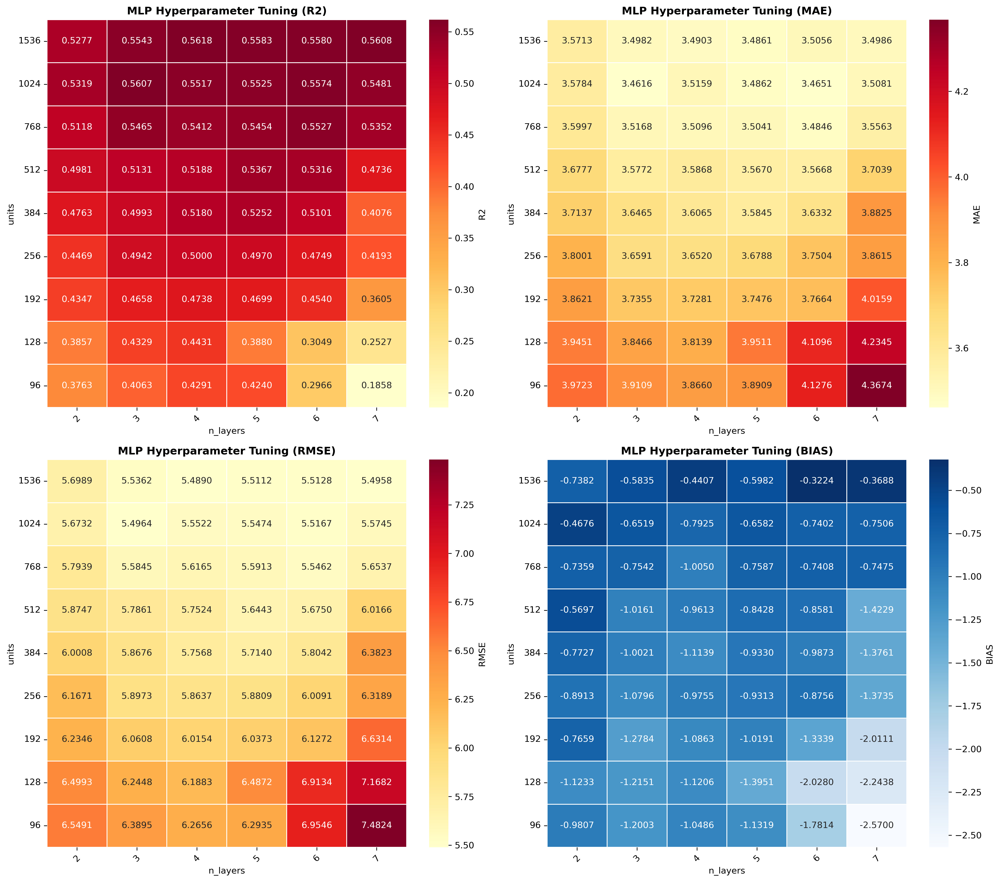

In [1]:
cmaps_ne = ["YlOrRd", "YlOrRd", "YlOrRd", "Blues"]
metrics = ["R2", "MAE", "RMSE", "BIAS"]

fig, axes = plt.subplots(2, 2, figsize=(16, 14), dpi=200)

for ax, metric, camps in zip(axes.flat, metrics, cmaps_ne):
    heatmap_data = mlp_df.pivot(
        index="units",
        columns="n_layers",
        values=metric
    ).sort_index(ascending=False)

    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".4f",
        cmap=camps,
        linewidths=0.5,
        linecolor="white",
        cbar_kws={"label": metric},
        ax=ax
    )

    ax.set_title(f"MLP Hyperparameter Tuning ({metric})", fontsize=12, fontweight="bold")
    ax.set_xlabel("n_layers")
    ax.set_ylabel("units")
    ax.tick_params(axis="x", rotation=45)
    ax.tick_params(axis="y", rotation=0)

plt.tight_layout()
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/MLP_heatmap.png"), Path(r"D:/Man/ERP/Figure/MLP_heatmap.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(out, dpi=300, bbox_inches="tight")
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


In [2]:
# CNN
cnn_df = pd.read_csv("D:/Man/ERP/code/data/result_data/CNN_tuning/CNN_All_result.csv")
cnn_df.head()

,filters,kernel_size,R2,MAE,RMSE,BIAS
0,16,2,0.1451,4.5886,7.6671,-2.1858
1,16,3,0.2533,4.3744,7.1656,-1.3816
2,16,4,0.3042,4.1850,6.9172,-1.5258
3,16,5,0.3407,4.0697,6.7331,-1.3826
4,16,6,0.3685,3.9940,6.5894,-1.3382


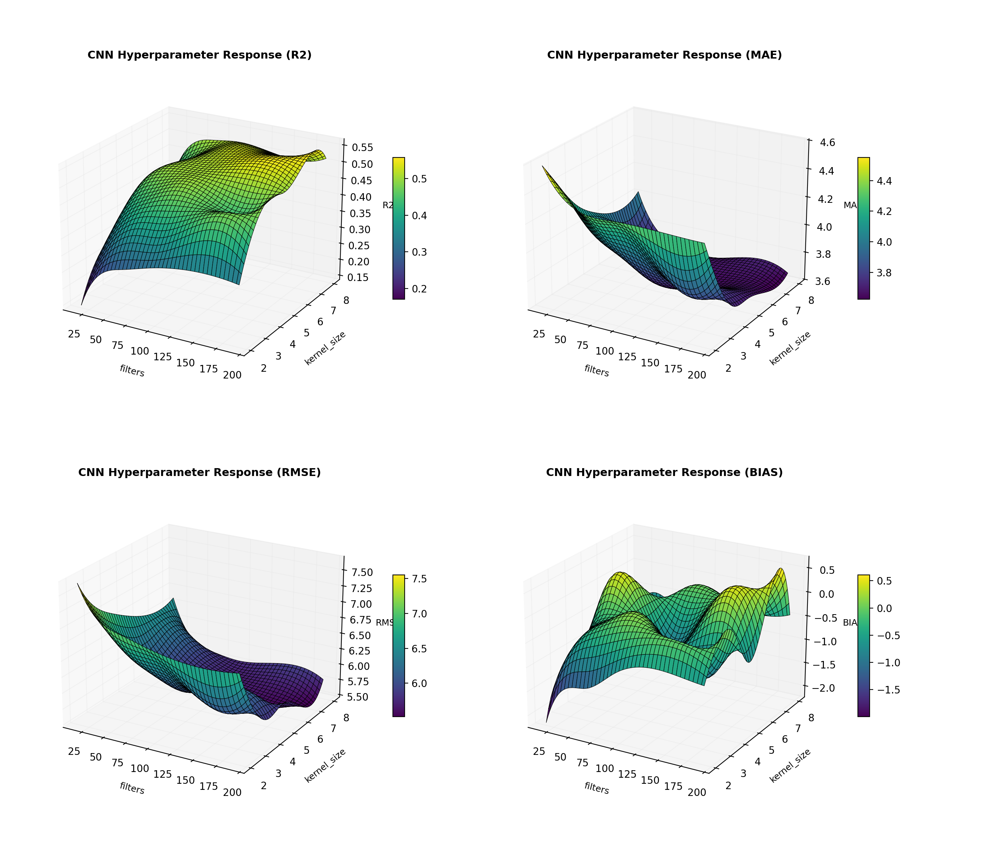

In [1]:
from scipy.interpolate import RectBivariateSpline

numeric_cols = ['filters','kernel_size','R2','RMSE','MAE','BIAS']

cnn_df[numeric_cols] = cnn_df[numeric_cols].apply(
    pd.to_numeric,
    errors='coerce'
)

def _metric_surface(df, xcol, ycol, metric, n=120):
    pivot = (
        df.pivot_table(index=ycol, columns=xcol, values=metric, aggfunc='mean')
        .sort_index(axis=0)
        .sort_index(axis=1)
    )
    xs = pivot.columns.to_numpy(dtype=float)
    ys = pivot.index.to_numpy(dtype=float)
    spline = RectBivariateSpline(ys, xs, pivot.to_numpy(dtype=float), kx=3, ky=3)
    x_range = np.linspace(xs.min(), xs.max(), n)
    y_range = np.linspace(ys.min(), ys.max(), n)
    gx, gy = np.meshgrid(x_range, y_range)
    gz = spline(y_range, x_range)
    return gx, gy, gz

grid_x, grid_y, grid_r2 = _metric_surface(cnn_df, 'filters', 'kernel_size', 'R2')
_, _, grid_mae = _metric_surface(cnn_df, 'filters', 'kernel_size', 'MAE')
_, _, grid_rmse = _metric_surface(cnn_df, 'filters', 'kernel_size', 'RMSE')
_, _, grid_bias = _metric_surface(cnn_df, 'filters', 'kernel_size', 'BIAS')

# Response surfaces for R2, MAE, RMSE and BIAS
fig3d = plt.figure(figsize=(14, 12), dpi=200)
metrics_grids = [grid_r2, grid_mae, grid_rmse, grid_bias]
metrics_names = ['R2', 'MAE', 'RMSE', 'BIAS']

for i, (grid_z, name) in enumerate(zip(metrics_grids, metrics_names)):
    ax = fig3d.add_subplot(2, 2, i+1, projection='3d')

    surf = ax.plot_surface(
        grid_x, grid_y, grid_z,
        cmap='viridis',
        linewidth=0.4,
        antialiased=True,
        edgecolors='black',
        rcount=40, ccount=40
    )

    ax.view_init(elev=22, azim=-60)
    ax.set_title(f'CNN Hyperparameter Response ({name})', fontsize=11, fontweight='bold', pad=10)
    ax.set_xlabel('filters', fontsize=9, labelpad=8)
    ax.set_ylabel('kernel_size', fontsize=9, labelpad=8)
    ax.set_zlabel(name, fontsize=9, labelpad=8)

    for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
        axis._axinfo["grid"]['color'] = (0.9, 0.9, 0.9, 0.4)

    fig3d.colorbar(surf, ax=ax, shrink=0.4, aspect=12, pad=0.08)

fig3d.subplots_adjust(left=0.04, right=0.92, top=0.94, bottom=0.04, wspace=0.12, hspace=0.18)
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/CNN_3D.png"), Path(r"D:/Man/ERP/Figure/CNN_3D.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        fig3d.savefig(out, dpi=300)
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()


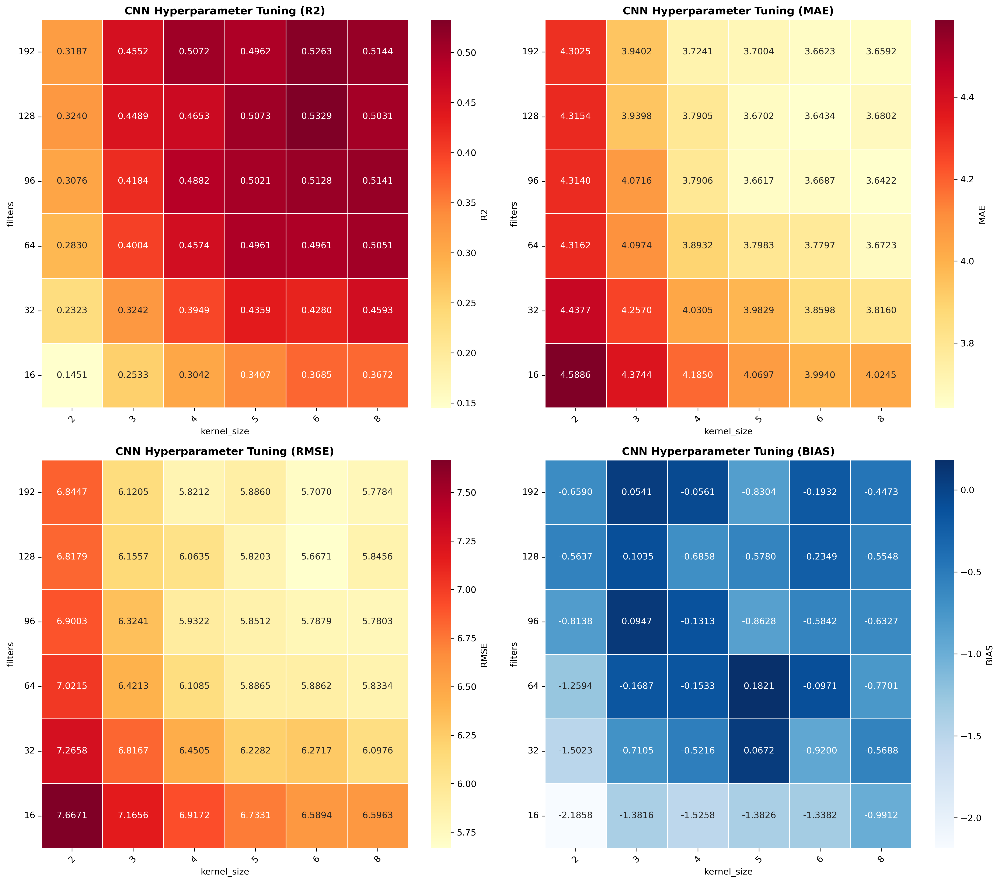

In [1]:
cmaps_ne = ["YlOrRd", "YlOrRd", "YlOrRd", "Blues"]
metrics = ["R2", "MAE", "RMSE", "BIAS"]

fig, axes = plt.subplots(2, 2, figsize=(16, 14), dpi=200)

for ax, metric, camps in zip(axes.flat, metrics, cmaps_ne):
    heatmap_data = cnn_df.pivot(
        index="filters",
        columns="kernel_size",
        values=metric
    ).sort_index(ascending=False)

    sns.heatmap(
        heatmap_data,
        annot=True,
        fmt=".4f",
        cmap=camps,
        linewidths=0.5,
        linecolor="white",
        cbar_kws={"label": metric},
        ax=ax
    )

    ax.set_title(f"CNN Hyperparameter Tuning ({metric})", fontsize=12, fontweight="bold")
    ax.set_xlabel("kernel_size")
    ax.set_ylabel("filters")
    ax.tick_params(axis="x", rotation=45)
    ax.tick_params(axis="y", rotation=0)

plt.tight_layout()
from pathlib import Path
for out in [Path(r"F:/Man/ERP/Figure/CNN_heatmap.png"), Path(r"D:/Man/ERP/Figure/CNN_heatmap.png")]:
    try:
        out.parent.mkdir(parents=True, exist_ok=True)
        plt.savefig(out, dpi=300, bbox_inches="tight")
        print('saved', out)
    except OSError as e:
        print('skip', out, e)
plt.show()
